In [1]:
#!pip install transformers torch sklearn
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from transformers import BertTokenizer, BertModel
from transformers import pipeline
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from transformers import pipeline
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
%matplotlib inline


#Import gensim, our library for text analysis
import gensim
from gensim.parsing.preprocessing import STOPWORDS
from gensim.corpora.dictionary import Dictionary
from sklearn.feature_extraction.text import CountVectorizer

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this

import pickle

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning);

import os


2024-12-11 01:11:40.554739: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1733897500.581323  268259 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1733897500.589473  268259 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-11 01:11:40.616176: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
#  Read in pickle file
data_words_bigrams = pd.read_pickle('scied_words_bigrams_V5.pkl')

In [3]:
# Check length of file 
len(data_words_bigrams)

5577

In [4]:
corpus = [ w for doc in data_words_bigrams for w in doc ]

In [5]:
from helpers import plot_freq_dist,get_top_n_words,plot_words_freq

Unfiltered Dictionary contains 200776 unique words


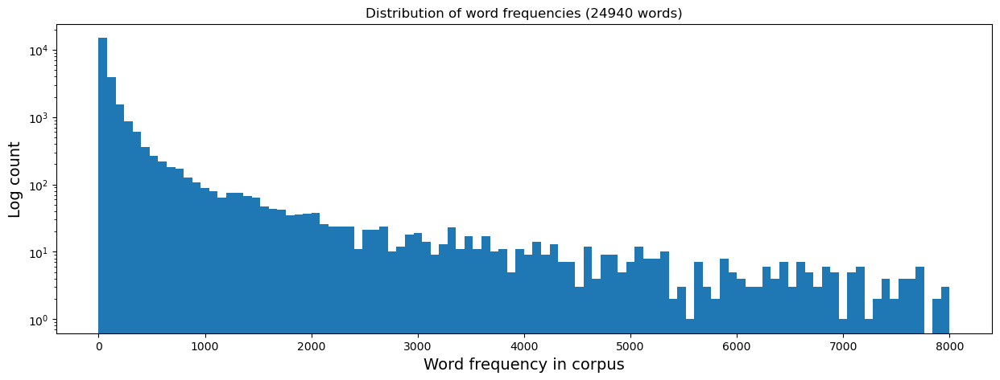

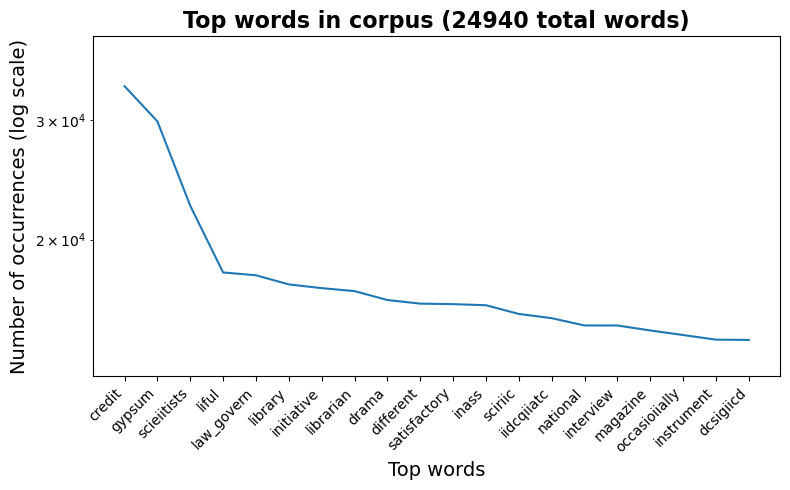

In [6]:
no_below = 15
no_above = 0.5

id2word_unfiltered_above = gensim.corpora.Dictionary(data_words_bigrams) #Needed for a bug
print("Unfiltered Dictionary contains \033[1m%d\033[0m unique words" % len(id2word_unfiltered_above)) #209780

id2word = gensim.corpora.Dictionary(data_words_bigrams)
id2word.filter_extremes(no_below=no_below, no_above=no_above, keep_n=100000)

#Create BoW
bow_corpus = [id2word.doc2bow(doc) for doc in data_words_bigrams]

[words, freq, ids] = get_top_n_words(corpus, n_top_words=None)

#Get most frequent words from id2word Dictionary
#There is a bug with csf: https://github.com/RaRe-Technologies/gensim/issues/2574
[ids, freq] = zip(*sorted(id2word.cfs.items(), key=lambda x: x[1], reverse=True))
words = [id2word_unfiltered_above[id] for id in ids]  #have to use id2word_unfiltered to retrieve words from ids!!

# Plot distribution
plot_freq_dist(freq, range=[0,8000])
plot_words_freq(words, freq, 20, ylim=None);

# Prepare Your Word Frequency Table:

In [7]:
word_list1 = [] 
word_freq1 = []

for i in range(len(id2word)):
    word_list1.append(id2word[ids[i]])
    word_freq1.append(freq[i])
                      
#word_list1
#word_freq1

word_freq = dict(zip(word_list1, word_freq1))
#word_freq

# Load the SciBERT Model:

In [8]:
# Load the SciBERT model and tokenizer
tokenizer = BertTokenizer.from_pretrained("allenai/scibert_scivocab_uncased")
model = BertModel.from_pretrained("allenai/scibert_scivocab_uncased")

# Embeddings by Word (not weighted by frequency):

# Get Word Embeddings:

In [9]:
# Function to get word embeddings
def get_word_embedding(word):
    # Tokenize the word and get the input tensor
    inputs = tokenizer(word, return_tensors="pt")
    
    # Pass the input through the model
    with torch.no_grad():
        outputs = model(**inputs)
    
    # The embedding of the word is the mean of the token embeddings
    word_embedding = outputs.last_hidden_state.mean(dim=1)  # Mean pooling
    return word_embedding

# Create a dictionary to store the word embeddings
word_embeddings = {}

for word in word_freq:
    word_embeddings[word] = get_word_embedding(word)

# Prepare Data for Clustering:

In [10]:
# Convert word embeddings to NumPy array for clustering
word_list = list(word_embeddings.keys())
embedding_matrix = np.vstack([word_embeddings[word].numpy() for word in word_list])

# Cluster the Word Embeddings:

In [11]:
from sklearn.cluster import KMeans

# Number of topics (clusters) you want to discover
n_clusters = 50 #200

# Fit a KMeans model to cluster the words based on their embeddings
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(embedding_matrix)

# Get the cluster assignments for each word
word_clusters = {word_list[i]: kmeans.labels_[i] for i in range(len(word_list))}

/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [12]:
# Display the words in each cluster
#for cluster_id in range(n_clusters):
for cluster_id in range(10):
    print(f"Cluster {cluster_id}:")
    cluster_words = [word for word, cluster in word_clusters.items() if cluster == cluster_id]
    print(", ".join(cluster_words))
    print()

Cluster 0:
revise, invite, precede, inservice, mile, urge, vygotsky, prevail, par, lisa, pride, volved, intervene, clement, dana, formance, gonna, disessa, mimeograph, ensue, cease, bourdieu, sue, bandura, quire, vosniadou, genius, lavoisier, freire, monica, julie, courage, longino, pamela, ous, lave, oblige, umbrella, motive, lava, dispose, quirements, resume, unite, penuel, dissonance, azevedo, archimedes, maine, navajo, sail, carlos, delve, julia, peirce, recite, chiappetta, coninion, sinatra, ethos, grave, ounce, impinge, plato, volves, palincsar, pervade, dispel, mellado, pajares, hooke, reshape, nazi, lunetta, en_courage, practicable, condemn, crete, merrill, anita, insigni, lore, navarra, eleanor, padilla, kozma, greta, improvise, de_moines, cies, ogunniyi, sistance, rosa, gomez, luncheon, concede, descartes, okebukola, etcetera, marvel, lure, titude, aleixandre, classrooni, televise, varelas, lege, commence, corre, convene, locale, surmise, bates, fortus, gale, grees, simile, e

# Visualizing Topics 

In [13]:
# Reduce dimensionality of the embeddings to 2D for visualization
pca = PCA(n_components=2)
reduced_embeddings = pca.fit_transform(embedding_matrix)

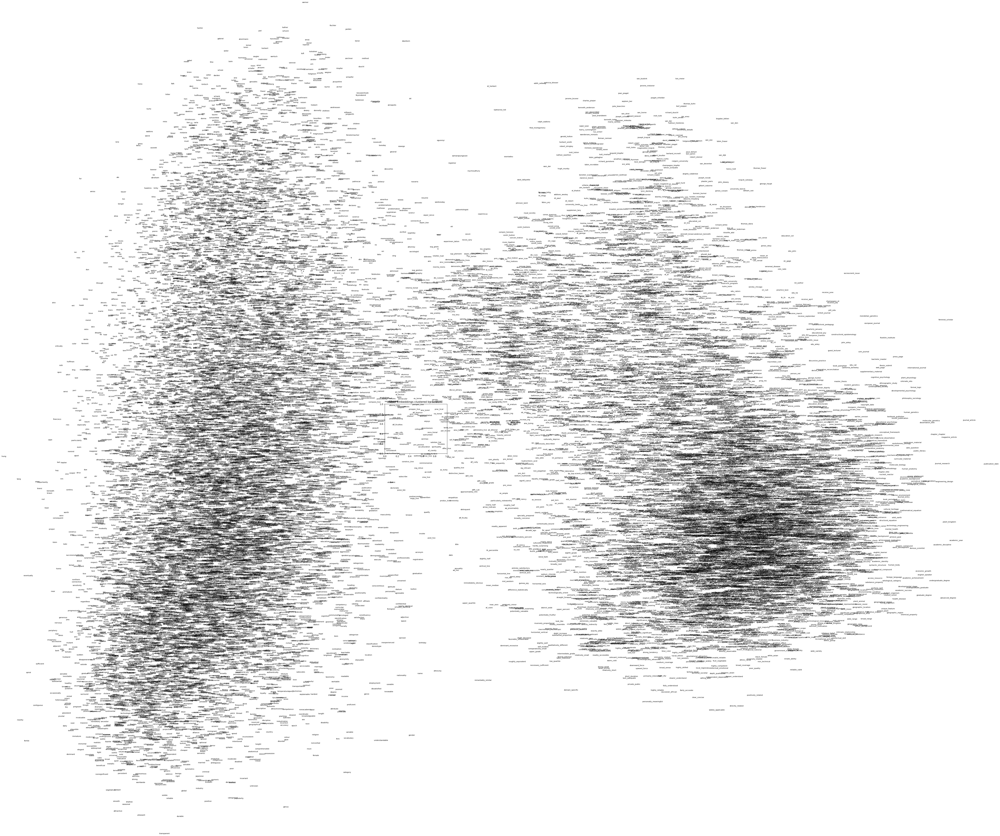

In [27]:
# Plot the 2D embeddings
plt.figure(figsize=(5, 4))

# Scatter plot with color-coded clusters
for i, word in enumerate(word_list):
    plt.text(reduced_embeddings[i, 0], reduced_embeddings[i, 1], word, fontsize=8)

plt.title("Word Embeddings clustered by SciBERT")
plt.show()

# Weighting Embeddings by Word Frequency:

In [14]:
# Weight embeddings by frequency
weighted_embeddings = []

for word in word_list:
    # Get the embedding and multiply it by the frequency of the word
    weighted_embedding = word_embeddings[word] * word_freq[word]
    weighted_embeddings.append(weighted_embedding)

# Convert to NumPy array
weighted_embedding_matrix = np.vstack(weighted_embeddings)

# Perform clustering again on the weighted embeddings
kmeans.fit(weighted_embedding_matrix)


/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=50, random_state=42)

In [15]:
# Get the cluster assignments for each word
word_clusters = {word_list[i]: kmeans.labels_[i] for i in range(len(word_list))}

In [16]:
# Display the words in each cluster
#for cluster_id in range(n_clusters):
for cluster_id in range(10):
    print(f"Cluster {cluster_id}:")
    cluster_words = [word for word, cluster in word_clusters.items() if cluster == cluster_id]
    print(", ".join(cluster_words))
    print()

Cluster 0:
inhelder_piaget, mc, taber, insofar, falk_dierking, judgement, certify, champagne_klopfer, brush, interscience_www, herbert, rc, margaret, delete, bourdieu, faulty, vi, rudolph, owers, bilingual, metz, en_vironment, twelfth_grade, jennifer, su, idaho, eccles, ly, membrane, stanley_brickhouse, windschitl, enlighten, sociocultural_perspective, nement, bohr, brickhouse, online_library, friday, handicap, directive, scien_ti, academic_performance, cognitively, oecd, yeast, expe_rience, jenkins, efficiently, principally, wang, kenneth_anderson, trade_book, walberg, biodiversity, constructivist_orient, earthworm, interview_protocol, ef_cient, coteaching, aspect_no, lc, spending, culminate, sadler, clarence_pruitt, patton, liu, egyptian, funda_mental, expenditure, nineteen, backyard, parenthesis, professional_growth, ceptual, controversial_issue, ladson_billing, froni, injustice, large_extent, bailey, non_western, inner_city, meta_analysis, el_khalick, fi, conserva_tion, stanley, og

# Calculate the Silhouette Score

In [17]:
sil_score = silhouette_score(embedding_matrix, kmeans.labels_)
print(f"Silhouette Score: {sil_score}")

Silhouette Score: -0.11204756796360016


# A low score indicates poor clustering

In [18]:
best_score = -1
best_n_clusters = 2

for n in range(10, 50,10):  
    kmeans = KMeans(n_clusters=n, random_state=42)
    kmeans.fit(embedding_matrix)
    score = silhouette_score(embedding_matrix, kmeans.labels_)
    
    if score > best_score:
        best_score = score
        best_n_clusters = n

print(f"Best number of clusters: {best_n_clusters}")
print(f"Best Silhouette Score: {best_score}")

/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/p

Best number of clusters: 10
Best Silhouette Score: 0.05264011397957802


# Dimensionality Reduction

In [19]:
# Reduce dimensions using PCA
pca = PCA(n_components=2)
reduced_embeddings = pca.fit_transform(embedding_matrix)

# Apply KMeans clustering on reduced embeddings
kmeans.fit(reduced_embeddings)
labels = kmeans.labels_

# Calculate Silhouette Score on reduced embeddings
sil_score = silhouette_score(reduced_embeddings, labels)
print(f"Silhouette Score (2D): {sil_score}")

/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Silhouette Score (2D): 0.3195168673992157


# Reducing dimensionality improves the silhouette score

# Optimal Number of Clusters

In [20]:
best_score = -1
best_n_clusters = 2
list_n = []
list_score =  []
for n in range(20, 200,10):
    kmeans = KMeans(n_clusters=n, random_state=42)
    kmeans.fit(reduced_embeddings)
    score = silhouette_score(reduced_embeddings, kmeans.labels_)
    list_n.append(n)
    list_score.append(score)
    if score > best_score:
        best_score = score
        best_n_clusters = n

print(f"Best number of clusters: {best_n_clusters}")
print(f"Best Silhouette Score: {best_score}")

/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/p

Best number of clusters: 20
Best Silhouette Score: 0.3303096294403076


In [21]:
df_Silhouette_Score = pd.DataFrame({'No_clusters': list_n, 'Silhouette_Score': list_score})

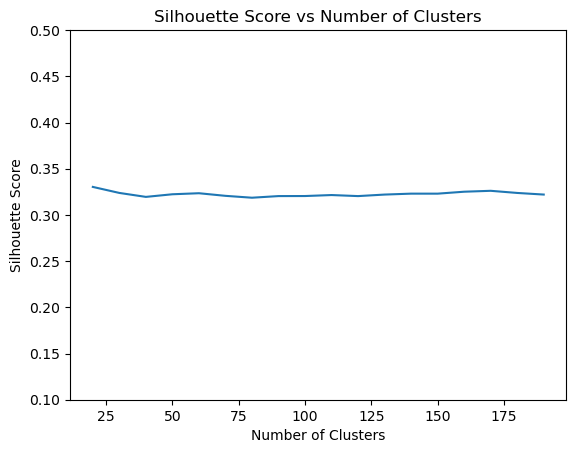

In [22]:
# Plot Silhouette Score vs Number of Clusters

f, ax = plt.subplots(1)
xdata = df_Silhouette_Score['No_clusters']
ydata = df_Silhouette_Score['Silhouette_Score']
ax.plot(xdata, ydata)
ax.set_title('Silhouette Score vs Number of Clusters')
ax.set_ylim(ymin=0.1, ymax = 0.5)
ax.set_xlabel('Number of Clusters')
ax.set_ylabel('Silhouette Score')
plt.show(f)


## - Silhouette Score does not change much as number of clusters is increased
## - Larger clusters are more interpretable 

# Calculate Coherence

In [23]:
data = {
    'word': word_list1,
    'frequency': word_freq1
}

df = pd.DataFrame(data)

def get_word_embedding2(word):
    inputs = tokenizer(word, return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)
    # Mean of the token embeddings to get a word-level embedding
    embedding = outputs.last_hidden_state.mean(dim=1)
    return embedding.squeeze().numpy()

# Get word embeddings for each word in the frequency table
df['embedding'] = df['word'].apply(get_word_embedding2)

embeddings1 = np.array(df['embedding'].to_list())

df

,word,frequency,embedding
0,child,33627,"[0.16889139, 0.3430659, -0.15028612, -0.701978..."
1,model,29850,"[0.28867626, 1.5275055, -0.2694903, -0.4307209..."
2,item,22431,"[0.20448743, 0.39880025, -0.26288465, -1.04522..."
3,score,17893,"[0.30205745, 1.0507778, -0.5701302, -1.1785401..."
4,response,17723,"[0.561975, 0.8373187, -0.40888163, -0.8709896,..."
...,...,...,...
24935,scherr_redish,15,"[0.19586478, -0.17079477, 0.5297165, -0.011498..."
24936,bell_lewenstein,15,"[-0.5768632, 0.3187139, -0.78031534, 0.1354207..."
24937,shouse_feder,15,"[-0.3211963, -0.060632665, 0.068726294, -0.000..."
24938,license_permit,15,"[0.45710555, 0.4289484, -0.9434099, -0.7526862..."


In [24]:
# Calculate the cosine similarity between all pairs of embeddings
cosine_sim = cosine_similarity(embeddings1)

# Display the cosine similarity matrix
similarity_matrix = pd.DataFrame(cosine_sim, columns=df['word'], index=df['word'])
#print(similarity_matrix)

# Function to calculate coherence score
def calculate_coherence(similarity_matrix):
    # Extract the upper triangular part of the matrix to avoid duplicate pairs
    upper_triangular = np.triu(similarity_matrix, k=1)
    
    # Flatten the upper triangular part and ignore the diagonal
    coherence_score = np.mean(upper_triangular[upper_triangular > 0])  # We only consider positive similarities
    return coherence_score

# Calculate coherence score for the word frequency table
coherence_score = calculate_coherence(cosine_sim)
print(f"Coherence Score: {coherence_score}")

Coherence Score: 0.6942116022109985
